<a href="https://colab.research.google.com/github/cheadrian/snake-reinforcement-learning/blob/main/Ray_RLlib_PyGame_Snake_Gym_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GPU check
Check if the instance is using GPU. 

You need a GPU.

In [ ]:
!nvidia-smi

Thu Mar 30 11:08:41 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Python libraries

## Install

In [ ]:
!pip install ray[rlib]
!pip install lz4
# OpenAI Gym is now Gymnasium
!pip install gymnasium
!pip install tensorboardX
!pip install pygame
!pip install ffmpeg-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 MB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.5/468.5 KB 14.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 9.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 925.5/925.5 KB 8.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 KB 2.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simpl

## Import

In [ ]:
import numpy as np 
from collections import namedtuple, deque
from itertools import count 
import random, datetime, os, copy, glob, math, time, asyncio, base64, shutil, gc
import ffmpeg
from IPython.display import HTML
from base64 import b64encode
import os

import cv2 

import gymnasium as gym
import ray, sys
from gymnasium import Env, spaces
from gymnasium.spaces import Box
from ray.rllib.algorithms import ppo
from ray.air.config import RunConfig, ScalingConfig, CheckpointConfig
from ray.air.checkpoint import Checkpoint
from ray.train.rl import RLTrainer, RLCheckpoint, RLPredictor
from ray.tune.tuner import Tuner

from ray.tune.registry import register_env
import IPython
from google.colab.patches import cv2_imshow
from IPython.display import clear_output 

/usr/local/lib/python3.9/dist-packages/flax/core/frozen_dict.py:169: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(
/usr/local/lib/python3.9/dist-packages/google/rpc/__init__.py:20: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google.rpc')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  pkg_resources.declare_namespace(__name__)
/usr/local/lib/python3.9/dist-packages/pkg_resources/__init__.py:2349: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('google')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.

# Define the environement

In [ ]:
# This is used by pygame to render using a `dummy` media driver
os.environ["SDL_VIDEODRIVER"] = "dummy"
# Due to ray might stop at full memory in Colab
os.environ["RAY_DISABLE_MEMORY_MONITOR"] = "1"
# Load pygame
import pygame
print(pygame.init())
print(pygame.display.list_modes())

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(4, 1)
[(1024, 768)]


# Clone the game assets

*License: Free with a link back to https://iconarchive.com* | [UFO pack](https://www.iconarchive.com/show/cute-ufo-icons-by-iconarchive.html).

## From Google Drive

Load Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Copy the game assets from Google Drive. You might replace them as you wish.

Download the example game assets from [here](https://raw.githubusercontent.com/cheadrian/snake-reinforcement-learning/main/snake_assets.zip) - [mirror](https://drive.google.com/file/d/1tRL5k8dUBsr-uZ7EJ4wBHnxJSWy7HeuZ/view?usp=share_link) and **place them in your Google Drive account as snake_assets.zip**, then run the code bellow.

In [ ]:
!cp /content/drive/MyDrive/snake_assets.zip /content/snake_assets.zip

## From Git

Faster, as you don't need to log in to Drive

In [ ]:
!wget https://raw.githubusercontent.com/cheadrian/snake-reinforcement-learning/main/snake_assets.zip -O /content/snake_assets.zip

--2023-03-30 11:09:37--  https://raw.githubusercontent.com/cheadrian/snake-reinforcement-learning/main/snake_assets.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1967755 (1.9M) [application/zip]
Saving to: ‘/content/snake_assets.zip’

/content/snake_asse 100%[===================>]   1.88M  --.-KB/s    in 0.1s    

2023-03-30 11:09:38 (14.1 MB/s) - ‘/content/snake_assets.zip’ saved [1967755/1967755]



## Extract assets

Unzip the game assets.

In [ ]:
!unzip snake_assets.zip

Archive:  snake_assets.zip
  inflating: snake/bug_1.png         
  inflating: snake/bug_2.png         
  inflating: snake/bug_3.png         
  inflating: snake/bug_4.png         
  inflating: snake/bug_boss.png      
  inflating: snake/canvas_type_1.png  
  inflating: snake/canvas_type_2.png  
  inflating: snake/canvas_type_3.png  
  inflating: snake/canvas_type_4.png  
  inflating: snake/LICENSE           


# Define the Gym Snake class
This will control the game created with Pygame using [Gymnasium](https://github.com/Farama-Foundation/Gymnasium) - replacement for OpenAI Gym.

In [ ]:
# You can use canvas_type_*.png from 1 to 4
canvas_path = os.path.abspath("/content/snake/canvas_type_1.png")
bug1_path = os.path.abspath("/content/snake/bug_1.png")
bug2_path = os.path.abspath("/content/snake/bug_2.png")
bug3_path = os.path.abspath("/content/snake/bug_3.png")
bug4_path = os.path.abspath("/content/snake/bug_4.png")
bug5_path = os.path.abspath("/content/snake/bug_boss.png")

class Snake(Env):
    def __init__(self, env_config):
        super(Snake, self).__init__()
        self.id = random.randint(0, 999999)
        #self.observation_shape = (168, 168, 3)
        self.observation_shape = (224, 224, 3)
        self.observation_space = spaces.Box(low = 0, 
                                            high = 255,
                                            shape = self.observation_shape,
                                            dtype = np.uint8)
    
        self.action_space = spaces.Discrete(5,)
        os.environ["SDL_VIDEODRIVER"] = "dummy" # might be removed

        check_errors = pygame.init()
        if check_errors[1] > 0:
            print(f'[!] Had {check_errors[1]} errors when initialising game, exiting...')
        else:
            print('[+] Game successfully initialised')
        
        self.frame_size_x = 400
        self.frame_size_y = 400
                
        self.canvas_pg = pygame.image.load(canvas_path)
        bug_1_pg = pygame.transform.scale(pygame.image.load(bug1_path), (20, 20))
        bug_2_pg = pygame.transform.scale(pygame.image.load(bug2_path), (20, 20))
        bug_3_pg = pygame.transform.scale(pygame.image.load(bug3_path), (20, 20))
        bug_4_pg = pygame.transform.scale(pygame.image.load(bug4_path), (20, 20))
        bug_5_pg = pygame.transform.scale(pygame.image.load(bug5_path), (20, 20))
        
        self.bugs_arr = [bug_1_pg, bug_2_pg, bug_3_pg, bug_4_pg, bug_5_pg]
        
        pygame.display.set_caption('Snake Eater')
        self.game_window = pygame.display.set_mode((self.frame_size_x, self.frame_size_y), flags=pygame.HIDDEN)
        
        self.black = pygame.Color(0, 0, 0)
        self.white = pygame.Color(255, 255, 255)
        self.red = pygame.Color(255, 0, 0)
        self.green = pygame.Color(0, 255, 0)
        self.blue = pygame.Color(0, 0, 255)
        self.snake_yellow = pygame.Color(246, 211, 73)
        
        # Game variables
        self.box_size = 20 #20x20 
        self.snake_pos_h = 10 * self.box_size
        self.border = 1
        
        self.food_pos = [random.randrange(1, (self.frame_size_x//self.box_size)) * self.box_size, random.randrange(1, (self.frame_size_y//self.box_size)) * self.box_size]
        self.food_spawn = True
        self.random_bug = self.bugs_arr[random.randrange(0,len(self.bugs_arr))]
        
        
    def show_score(self, color, size):
        score_font = pygame.font.Font(pygame.font.get_default_font(), size)
        score_surface = score_font.render(str(self.score), True, color)
        score_rect = score_surface.get_rect()
        score_rect.midtop = (self.frame_size_x/self.box_size-8, 10)
        self.game_window.blit(score_surface, score_rect)
    
    def do_action(self, change_to):
        # Making sure the snake cannot move in the opposite direction instantaneously
        if change_to == 3 and self.direction != 'DOWN':
            self.direction = 'UP'
        if change_to == 2 and self.direction != 'UP':
            self.direction = 'DOWN'
        if change_to == 1 and self.direction != 'RIGHT':
            self.direction = 'LEFT'
        if change_to == 0 and self.direction != 'LEFT':
            self.direction = 'RIGHT'
    
        # Moving the snake
        if self.direction == 'UP':
            self.snake_pos[1] -= self.box_size
        if self.direction == 'DOWN':
            self.snake_pos[1] += self.box_size
        if self.direction == 'LEFT':
            self.snake_pos[0] -= self.box_size
        if self.direction == 'RIGHT':
            self.snake_pos[0] += self.box_size
    
        # Snake body growing mechanism
        self.snake_body.insert(0, list(self.snake_pos))
        if self.snake_pos[0] == self.food_pos[0] and self.snake_pos[1] == self.food_pos[1]:
            self.score += 1
            #print(self.score)
            self.food_spawn = False
        else:
            self.snake_body.pop()
    
        # Spawning food on the screen
        if not self.food_spawn:
            self.random_bug = self.bugs_arr[random.randrange(0,len(self.bugs_arr))]
            self.food_pos = [random.randrange(1, (self.frame_size_x//self.box_size)) * self.box_size, random.randrange(1, (self.frame_size_y//self.box_size)) * self.box_size]
            for block in self.snake_body[0:]:
                if self.food_pos[0] == block[0] and self.food_pos[1] == block[1]:
                    self.food_pos = [random.randrange(1, (self.frame_size_x//self.box_size)) * self.box_size, random.randrange(1, (self.frame_size_y//self.box_size)) * self.box_size]
    
        self.food_spawn = True
        
        # GFX
        self.game_window.blit(self.canvas_pg, (0,0))
        for pos in self.snake_body:
            pygame.draw.rect(self.game_window, self.white, pygame.Rect(pos[0]-self.border, pos[1]-self.border, self.box_size+2*self.border, self.box_size+2*self.border))
            pygame.draw.rect(self.game_window, self.snake_yellow, pygame.Rect(pos[0]+self.border, pos[1]+self.border, self.box_size-2*self.border, self.box_size-2*self.border))
        
        self.game_window.blit(self.random_bug, (self.food_pos[0], self.food_pos[1]))
    
        # Game Over conditions
        # Getting out of bounds
        done = False
        if self.snake_pos[0] < 0 or self.snake_pos[0] > self.frame_size_x-self.box_size:
            done = True
        if self.snake_pos[1] < 0 or self.snake_pos[1] > self.frame_size_y-self.box_size:
            done = True
        # Touching the snake body
        for block in self.snake_body[1:]:
            if self.snake_pos[0] == block[0] and self.snake_pos[1] == block[1]:
                done = True
    
        self.show_score(self.snake_yellow, 20)
        pygame.display.update()
        view = pygame.surfarray.array3d(self.game_window)
        view = view.transpose([1, 0, 2])
        view = cv2.cvtColor(view, cv2.COLOR_BGR2RGB)
        #cv2_imshow(view)
        return view, done              
        
    def reset(self, seed=None, options=None):
        # Might need to implement the new "seed", "options" args: https://gymnasium.farama.org/api/env/#gymnasium.Env.reset
        # Reset the fuel consumed
        self.snake_pos = [60, self.snake_pos_h]
        self.snake_body = [[60, self.snake_pos_h], [60-self.box_size, self.snake_pos_h], [60-(2*self.box_size), self.snake_pos_h]]
        
        self.direction = 'RIGHT'
        self.change_to = 0
        
        self.score = 0
        canvas, done = self.do_action(0)
        self.score = 0
        self.last_score = 0

        obs = cv2.resize(canvas, (self.observation_shape[0], self.observation_shape[1]))
        # Might need to implement "info" dict
        return obs, {}
                   
    def step(self, action):
        #reward = 0 

        assert self.action_space.contains(action), "Invalid Action"
        canvas, done = self.do_action(action)
        if(done):
            self.reset()
        score = self.score

        reward = 1

        if(score != self.last_score):
            reward = 15
            self.last_score = score
        
        
        obs = cv2.resize(canvas, (self.observation_shape[0], self.observation_shape[1]))
        # Don't use premature episode ending, yet: https://gymnasium.farama.org/api/env/#gymnasium.Env.step
        truncated = False
        return obs, reward, done, truncated, {"score": self.score}

You can skip this.

Let's see how it looks. 
Get the first frame from the game.

[!] Had 1 errors when initialising game, exiting...


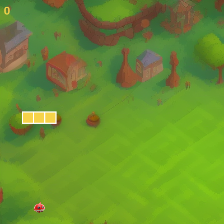

In [ ]:
env = Snake('')
cv2_imshow(env.reset()[0])
env.close()

# Initialize the Ray

In [ ]:
if ray.is_initialized():
  ray.shutdown()
ray.init(include_dashboard=False, ignore_reinit_error=True, logging_level="info", 
         log_to_driver=False, object_store_memory=0.2*10**9) 
#object_store_memory=5*10**9  local_mode=True, num_gpus=1

2023-03-30 11:28:17,827	INFO worker.py:1553 -- Started a local Ray instance.


Python version:,3.9.16
Ray version:,2.3.1


In [ ]:
ray.available_resources()

{'CPU': 2.0,
 'object_store_memory': 200000000.0,
 'GPU': 1.0,
 'memory': 11829493658.0,
 'node:172.28.0.12': 1.0}

# TensorBoard
To see traning data live.

In [ ]:
%load_ext tensorboard
#%tensorboard --logdir={ray_results}#{last_ray_results[0]}
%tensorboard --logdir="/content/saved_models"

display(IPython.display.HTML('''
<button id='open_tb'>Open TensorBoard</button> 
<button id='hide_tb'>Hide TensorBoard</button> 
<script>document.querySelector('#open_tb').onclick = () => { window.open(document.querySelector('iframe').src, "__blank") }
        document.querySelector('#hide_tb').onclick = () => { document.querySelector('iframe').style.display = "none" }</script>'''))

<IPython.core.display.Javascript object>

# Train the network
Train the network using the Ray RLlib.

Define where the model and training data will be saved and if the checkpoint is used.

In [ ]:
save_dir = "/content/saved_models"
def snake_env_creator(env_config):
    return Snake(env_config)
register_env("snake", snake_env_creator)
# Set to true if you want to load a checkpoint
USE_CHECKPOINT = False
gc.set_threshold(80)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Load checkpoint
If you want to use a saved checkpoint, load the saved_models from your Google Drive

**SKIP THIS** if you don't have a checkpoint or don't want to use one.

In [ ]:
# SKIP THIS if you don't have a checkpoint
!cp -r /content/drive/MyDrive/saved_snake_models/* /content/saved_models

In [ ]:
# Put the proper path for checkpoint_path and set USE_CHECKPOINT to True
checkpoint_path = "/content/saved_models/AIRPPO_2022-10-28_10-56-01/AIRPPO_1c93a_00000_0_2022-10-28_10-56-01/checkpoint_000100"
### checkpoint_store = ray.put(checkpoint_path)

## Configuring the trainer

Useful links:

[Getting Started with RLlib
](https://docs.ray.io/en/latest/rllib/rllib-training.html)

[ray.train.rl.RLTrainer
](https://docs.ray.io/en/latest/train/api/doc/ray.train.rl.RLTrainer.html#ray-train-rl-rltrainer)

**[Configuring RLlib Algorithms](https://docs.ray.io/en/latest/rllib/rllib-training.html#configuring-rllib-algorithms)**

[class PPOConfig - code](https://github.com/ray-project/ray/blob/c6d3d619e7a6e9cd7d03694ff84dafeef3b3d6c5/rllib/algorithms/ppo/ppo.py#L54)

You might want to check the last one.

In [ ]:
#
# Tune the configuration as you need. Learn more at the Ray documentation for each algorithm.
# This example should work as it is.
#

config_cf = {
    
    #
    # Maximize performance according to hardware
    # https://docs.ray.io/en/latest/rllib/rllib-training.html
    #

    "num_workers": 4, 
    #"simple_optimizer": True,

    #
    # Number of parallel workers to use for evaluation. 
    #

    "evaluation_num_workers": 1, 

    #
    # Number of environments to evaluate vector-wise per worker. 
    # This enables model inference batching, which can improve performance for inference bottlenecked workloads.
    #
    # A standard Colab instance would have 2 CPUs and 1 GPU, so we split that to "num_workers" + evaluation_num_workers
    #

    "num_envs_per_worker": 1,
    "num_cpus_for_driver": 0,
    # Defined also in scaling_config, so commented here
    #"num_cpus_per_worker": 0.25, 
    #"num_gpus_per_worker": 0.125, 

    #
    # Ray will use the Snake environment we defined.
    #

    "env": "snake",

    #
    # The default learning rate.
    #

    "lr": 0.0001, 

    #
    # Float specifying the discount factor of the Markov Decision process.
    #

    "gamma": 0.99, 

    #
    # Initial coefficient for KL divergence.
    #

    "kl_coeff": 0.2, 

    #
    # The GAE (lambda) parameter.
    #
    
    "lambda": 0.99,

    #
    #  Target value for KL divergence.
    #

    "kl_target": 0.03,

    #
    # Coefficient of the entropy regularizer.
    #

    "entropy_coeff": 0.01,

    #
    # Learning rate schedule. 
    # In the format of [[timestep, lr-value], [timestep, lr-value], …] 
    # Intermediary timesteps will be assigned to interpolated learning rate values. 
    # A schedule should normally start from timestep 0.
    #
    
    "lr_schedule": [[25000, 0.0001], [50000, 0.00005], [75000, 0.00001]],
    
    #
    # Decay schedule for the entropy regularizer.
    #

    #"entropy_coeff_schedule": [[50000, 0.00]],
    
    #
    # Horizon might limit how much score the Snake can make after a certain threshold.
    # If you find horizon too low, you should increase it. Read the RLlib docs.
    #

    "horizon":  500,

    #
    # Using PyTorch as ML framework
    #

    "framework": "torch", 
    "train_batch_size": 500,

    #
    # Total SGD batch size across all devices for SGD. This defines the minibatch size within each epoch.
    #

    "sgd_minibatch_size": 100,
    
    #
    # Number of SGD iterations in each outer loop (i.e., number of epochs to execute per train batch).
    #

    "num_sgd_iter": 30,
    
    "vf_share_layers": True,

    #
    # Coefficient of the value function loss. 
    # IMPORTANT: you must tune this if you set vf_share_layers=True inside your model’s config.
    #

    "vf_loss_coeff": 1.0,
    "clip_rewards": True,

    #
    # PPO clip parameter.
    #

    "clip_param": 0.3,

    #
    # Clip param for the value function. 
    # Note that this is sensitive to the scale of the rewards. If your expected V is large, increase this. 
    #

    "vf_clip_param": 10.0,

    #
    # This will affect how the rollout will be handled. "auto"
    # https://docs.ray.io/en/latest/rllib/rllib-sample-collection.html
    #

    "rollout_fragment_length": "auto",
    "batch_mode": "truncate_episodes",


    # 
    # Here's the CNN and ltms model definition. You might want to adjust this if you want experimenting.
    # Make sure it's compatible with your output resolution from the Snake game class above.
    # Ray will get you an error if the dimension mismatch between layers.
    #

    #
    #"model": {"dim": 168, "conv_filters": [[32, [4, 4], 4], [128, [4, 4], 3], [256, [4, 4], 3], [512, [4, 4], 4]], "fcnet_hiddens": [1024, 512, 512], "fcnet_activation": "than", "use_lstm": False},# "lstm_cell_size": 32, "max_seq_len": 16},
    #"model": {"dim": 400, "conv_filters": [[64, [5, 5], 4], [128, [4, 4], 4], [256, [4, 4], 5], [512, [5, 5], 5]], "fcnet_hiddens": [1024, 512, 512], "fcnet_activation": "than", "use_lstm": False},
    #

    # MobileNet like model example 224x224:
    #

    "model": {"dim": 224, "conv_filters": [[16, [3, 3], 2], [32, [3, 3], 3], [64, [5, 5], 5], [128, [5, 5], 5]], "fcnet_hiddens": [1024, 512, 512], "fcnet_activation": "than", "use_lstm": False},

    #
    # This will evaluate the model at defined interval * batch_size steps; e.g. every N training_iteration
    # Pick a larger evaluation_interval, as it is slow and requires a lot of resources for standard colab
    #

    "evaluation_interval": 200, "evaluation_config": {'explore': False, "input": "sampler"}, "log_level": "ERROR",
    "evaluation_parallel_to_training": True,

    #

    #
    # Exploration config is quite important, and you might want to tune this.
    #

    "explore": True,

    #
    # EpsilonGreedy strategy chooses a random action with probability epsilon,
    # otherwise chooses the action with the highest predicted value according to the learned policy. 
    # The value of epsilon starts at 1.0 and is linearly annealed to 0.1 over 10000 timesteps.
    #

    #"exploration_config": {"type": "EpsilonGreedy", "initial_epsilon": 0.96, "final_epsilon": 0.01, "epsilon_timesteps": 10000},

    #
    # StochasticSampling randomly samples actions from the action distribution produced by the policy network, 
    # rather than selecting the action with the highest predicted value.
    #

    "exploration_config": {"type": "StochasticSampling", "random_timesteps": 2000},
   }

#    
# Train for 100,000 timesteps.
# Should be sufficient for a fast trained (under 30 mins) demo.
# Use above 500,000 if you need a proper working model.
#

stop_cf = {"timesteps_total":  250000}

## Create the ray trainer

In [ ]:
run_config = RunConfig(
    local_dir=save_dir,
    stop=stop_cf,
    # Save a maximum X checkpoints at every N training_iteration
    checkpoint_config=CheckpointConfig(
        checkpoint_score_attribute = "episode_reward_mean",
        checkpoint_score_order = "max",
        checkpoint_frequency=50,
        checkpoint_at_end=True,
        num_to_keep = 2
    ),

    verbose=1, #3
    progress_reporter=ray.tune.JupyterNotebookReporter(
        overwrite=True,  
        parameter_columns=["entropy"],
        print_intermediate_tables=True,
        metric_columns=["training_iteration", "episode_reward_min", "episode_reward_mean", "episode_reward_max"], 
        #metric="episode_reward_mean", mode="max"
        ),
    )

rl_checkpoint = None
if USE_CHECKPOINT:
    rl_checkpoint = RLCheckpoint(local_path = checkpoint_path)
#rl_checkpoint = ray.put(rl_checkpoint)

trainer = RLTrainer(
    run_config=run_config,
     scaling_config=ScalingConfig(
        num_workers=4, use_gpu=True,
        trainer_resources={"CPU": 0.0}, 
        resources_per_worker={"CPU": 0.4}),
    algorithm="PPO",
    config=config_cf,
    resume_from_checkpoint=rl_checkpoint,
)

In [ ]:
trainer.as_trainable().default_resource_request(config_cf)

<ResourceRequest (_bound=<BoundArguments (bundles=[{'GPU': 1.0}, {'CPU': 0.4}, {'CPU': 0.4}, {'CPU': 0.4}, {'CPU': 0.4}, {'CPU': 0.4}], strategy='PACK')>, head_bundle_is_empty=False)>

In [ ]:
tune = ray.tune.Tuner(trainer)

2023-03-30 11:46:26,931	INFO tuner_internal.py:90 -- A `RunConfig` was passed to both the `Tuner` and the `RLTrainer`. The run config passed to the `Tuner` is the one that will be used.


Start training

In [ ]:
tune.fit()
#result = trainer.fit() # alternative

2023-03-30 13:35:30,859	INFO tune.py:798 -- Total run time: 6541.35 seconds (6540.81 seconds for the tuning loop).


**SKIP THIS** - This will delete the trained model folder and data.

You might use this if you failed to set the config properly or got some error, and want a clean **saved_models** folder.

In [ ]:
#!rm -R /content/saved_models/*

### Copy the model and data to Drive

In [ ]:
!cp -r /content/saved_models /content/drive/MyDrive/saved_snake_models

## Resume unfinished training
If you ended the training prematurely, you can resume it, if it has a checkpoint, using the code bellow.

In [ ]:
last_tune = sorted(glob.iglob(os.path.join(save_dir, '*')), key=os.path.getctime, reverse=True) 
print(last_tune[0])

/content/nextcloud/AI/saved_models/AIRPPO_2022-10-22_15-56-48


In [ ]:
tuner = Tuner.restore(last_tune[0])

In [ ]:
Tuner()

In [ ]:
tuner.fit()

### Copy the model and data to Drive

In [ ]:
!cp -r /content/saved_models /content/drive/MyDrive/saved_snake_models

# Predict 
This will load the model and create prediction based on your trained model.

In [ ]:
# Find the latest checkpoint
def directory_find(atom, root='.'):
  checkpoint =[]
  for path, dirs, files in os.walk(root):
    for d in dirs:
      if atom in d:
        checkpoint.append(os.path.join(path, d))
  return checkpoint
# Note: this will get the checkpoint with the biggest number with training_iterations
latest_checkpoint = max(directory_find("checkpoint_", "/content/saved_models/"))

In [ ]:
# Replace the path with the checkpoint you want to use
checkpoint_path = latest_checkpoint
rl_checkpoint = RLCheckpoint(local_path = checkpoint_path)
predictor =  RLPredictor.from_checkpoint(checkpoint=rl_checkpoint)

2023-03-30 13:47:06,445	INFO policy.py:1214 -- Policy (worker=local) running on 1 GPUs.
2023-03-30 13:47:06,472	INFO torch_policy_v2.py:110 -- Found 1 visible cuda devices.


In [ ]:
!mkdir /content/video_run

In [ ]:
env = Snake("")
rewards = []
num_episodes=5
for i in range(num_episodes):
    vid_out = cv2.VideoWriter(f'/content/video_run/snake_run_{i}.mp4', cv2.VideoWriter_fourcc(*'mp4v'), 10, (224,224))
    obs,_ = env.reset()
    reward = 0.0
    done = False
    while not done:
      action = predictor.predict(np.array([obs]))
      obs, r, done, _, _ = env.step(action[0])
      clear_output(wait=True)
      cv2_imshow(obs)
      vid_out.write(obs)
      reward += r
    rewards.append(reward)
    vid_out.release()
print(rewards)

[!] Had 1 errors when initialising game, exiting...
[1067.0, 207.0, 564.0, 223.0, 444.0]


In [ ]:
!rm /content/snake_run_all.mp4

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Concatenate all episodes video in a single file
vids = []
for f in os.listdir("/content/video_run/"):
  if f.endswith(".mp4"):
    vids.append(f"/content/video_run/{f}")
    
open('concat.txt', 'w').writelines([('file %s\n' % input_path) for input_path in vids])
ffmpeg.input('concat.txt', format='concat', safe=0).output('/content/snake_run_all.mp4', vcodec='libx265').run()

(None, None)

In [ ]:
# https://stackoverflow.com/a/65273831/10096536
compressed_path = "/content/snake_run_all.mp4"
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""<video width=224 controls><source src="%s" type="video/mp4"></video>""" % data_url)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
